# 深度学习第二课：逻辑回归（二分类）

## 本课唯一教学目标

让你理解：

| 核心要点 | 关键理解 |
|---------|----------|
| 分类 ≠ 回归 | 分类的输出是离散的类别，不是连续的数值 |
| 输出是概率 | 模型输出 $\hat{y} \in (0, 1)$，表示属于正类的概率 |
| Loss 必须匹配任务语义 | 分类用 BCE（二元交叉熵），不是 MSE |
| 训练仍是梯度下降 | 核心流程不变：前向传播 → 计算损失 → 反向求梯度 → 更新参数 |

### 从线性回归到分类：一步跨越

上一课你学了线性回归，模型输出 $\hat{y} = wx + b$ 可以是任意实数。

但如果问题变成 **"这个点属于哪一类？"**，输出就应该是一个**类别概率**。

逻辑回归就是解决这个问题的最简单模型——它是从回归到分类的**桥梁**，也是理解神经网络的**基石**。

---
## 1. 环境准备

In [155]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.sans-serif'] = ['Arial Unicode MS', 'SimHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
np.random.seed(0)  # 固定随机种子，确保可复现

---
## 2. 数据集：2D 两团高斯

### 为什么选这个数据集？

1. **2D 可视化直观**：可以用散点图展示数据，用直线展示决策边界
2. **线性可分**：逻辑回归可以"完美发挥"，不会因为数据本身的复杂性而失败
3. **可控的难度**：通过调整 `sigma` 控制两类数据的重叠程度

### 数据生成

- **正类（y=1）**：以 $(+1, +1)$ 为中心的高斯分布
- **负类（y=0）**：以 $(-1, -1)$ 为中心的高斯分布

In [156]:
# 数据生成参数
N = 200  # 总样本数
sigma = 0.6  # 标准差（控制类间重叠程度，越大越难分）

# 生成两类数据
X_pos = np.random.randn(N // 2, 2) * sigma + np.array([1, 1])   # 正类
X_neg = np.random.randn(N // 2, 2) * sigma + np.array([-1, -1]) # 负类

# 合并数据
X = np.vstack([X_pos, X_neg])  # shape: (N, 2)
y = np.hstack([np.ones(N // 2), np.zeros(N // 2)])  # shape: (N,)

print(f"数据形状: X = {X.shape}, y = {y.shape}")
print(f"正类样本数: {np.sum(y == 1)}, 负类样本数: {np.sum(y == 0)}")

数据形状: X = (200, 2), y = (200,)
正类样本数: 100, 负类样本数: 100


### 可视化数据集

下图展示了生成的两类数据。蓝色点是负类 (y=0)，红色点是正类 (y=1)。

直观上可以看到，两类数据可以用一条直线来分开——这就是我们的目标。

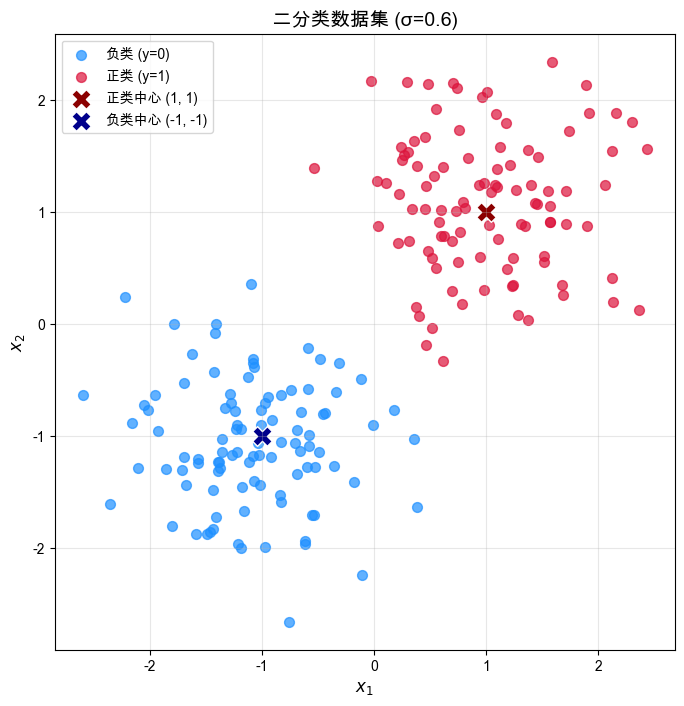

In [157]:
plt.figure(figsize=(8, 8))
plt.scatter(X[y == 0, 0], X[y == 0, 1], c='dodgerblue', label='负类 (y=0)', alpha=0.7, s=50)
plt.scatter(X[y == 1, 0], X[y == 1, 1], c='crimson', label='正类 (y=1)', alpha=0.7, s=50)
plt.scatter([1], [1], c='darkred', s=200, marker='X', edgecolors='white', label='正类中心 (1, 1)')
plt.scatter([-1], [-1], c='darkblue', s=200, marker='X', edgecolors='white', label='负类中心 (-1, -1)')
plt.xlabel('$x_1$', fontsize=12)
plt.ylabel('$x_2$', fontsize=12)
plt.title(f'二分类数据集 (σ={sigma})', fontsize=14)
plt.legend()
plt.axis('equal')
plt.grid(True, alpha=0.3)
plt.show()

---
## 3. 模型定义：从"线性分数"到"概率"

### 3.1 线性打分（Logit）

和线性回归类似，我们先计算一个**线性分数**（也叫 logit）。

假设我们的输入样本有两个特征：$x_1$ 和 $x_2$（在本教程中，就是二维平面上点的横坐标和纵坐标）。对应地，模型需要学习两个权重参数 $w_1$ 和 $w_2$，以及一个偏置项 $b$（偏置项的作用是让决策边界不必经过原点，就像直线方程 $y = kx + b$ 中的截距一样）。

线性分数的计算很直观：

$$z = w_1 \cdot x_1 + w_2 \cdot x_2 + b$$

即：**每个特征乘以对应的权重，然后全部加起来，最后加上偏置项**。

> 💡 如果你学过线性代数，上面的公式可以简写成向量内积的形式：$z = w^	op x + b$，其中 $w = [w_1, w_2]^	op$，$x = [x_1, x_2]^	op$。但如果你还没学过也没关系，只要理解权重乘以特征再求和这个思想就可以了。

这个分数可以是任意实数：
- $z > 0$：倾向于正类
- $z < 0$：倾向于负类
- $z = 0$：刚好在决策边界上

但问题是：**$z$ 不是概率！** 它的范围是 $(-\infty, +\infty)$，而概率应该在 $[0, 1]$ 之间。

### 3.2 Sigmoid 函数：把分数变成概率

为了把 $z$ 转换成概率，我们使用 **Sigmoid 函数**：

$$\hat{y} = \sigma(z) = \frac{1}{1 + e^{-z}}$$

Sigmoid 函数的性质：

| 输入 $z$ | 输出 $\hat{y}$ | 含义 |
|---------|----------------|------|
| $z \to +\infty$ | $\hat{y} \to 1$ | 非常确信是正类 |
| $z = 0$ | $\hat{y} = 0.5$ | 完全不确定，五五开 |
| $z \to -\infty$ | $\hat{y} \to 0$ | 非常确信是负类 |

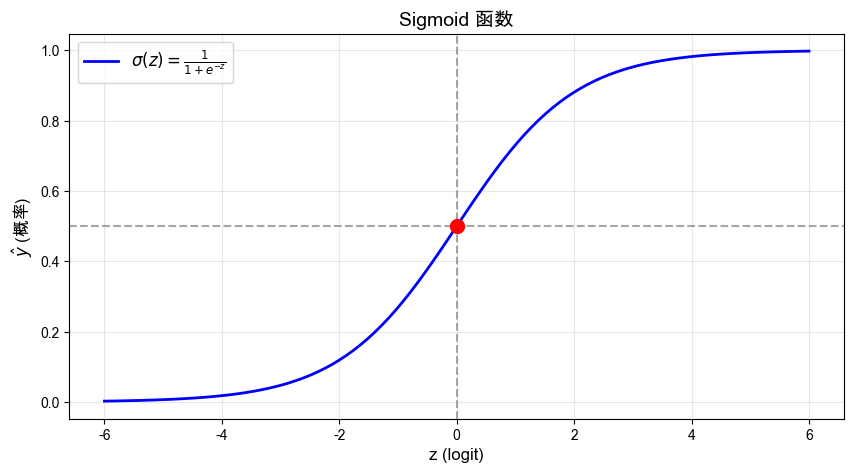

Sigmoid 函数的关键点：
  σ(-6) = 0.002473  (接近 0)
  σ( 0) = 0.500000  (恰好 0.5)
  σ(+6) = 0.997527  (接近 1)


In [158]:
def sigmoid(z):
    """Sigmoid 激活函数"""
    return 1 / (1 + np.exp(-z))

# 可视化 Sigmoid 函数
z_plot = np.linspace(-6, 6, 100)
y_sigmoid = sigmoid(z_plot)

plt.figure(figsize=(10, 5))
plt.plot(z_plot, y_sigmoid, 'b-', linewidth=2, label=r'$\sigma(z) = \frac{1}{1 + e^{-z}}$')
plt.axhline(y=0.5, color='gray', linestyle='--', alpha=0.7)
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.7)
plt.scatter([0], [0.5], color='red', s=100, zorder=5)
plt.xlabel('z (logit)', fontsize=12)
plt.ylabel('$\hat{y}$ (概率)', fontsize=12)
plt.title('Sigmoid 函数', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

print("Sigmoid 函数的关键点：")
print(f"  σ(-6) = {sigmoid(-6):.6f}  (接近 0)")
print(f"  σ( 0) = {sigmoid(0):.6f}  (恰好 0.5)")
print(f"  σ(+6) = {sigmoid(6):.6f}  (接近 1)")

### 3.3 决策规则

有了概率输出 $\hat{y}$，决策规则就很简单：

$$\text{预测类别} = \begin{cases} 1 & \text{if } \hat{y} > 0.5 \\ 0 & \text{otherwise} \end{cases}$$

这等价于：

$$\text{预测类别} = \begin{cases} 1 & \text{if } z > 0 \\ 0 & \text{otherwise} \end{cases}$$

> **核心洞察**：决策边界就是 $z = 0$ 的那条线，即 $w_1 x_1 + w_2 x_2 + b = 0$。这是一条**直线**！

---
## 4. 损失函数：Binary Cross Entropy（本课最关键！）

### 为什么不用 MSE？

在线性回归中我们用 MSE（均方误差）作为损失函数。你可能会想：分类问题也用 MSE 行不行？

**答案是：不行！** 原因有两个：

1. **梯度性质差**：MSE + Sigmoid 组合会导致在远离正确答案时梯度反而很小（饱和区域学习慢）
2. **统计意义不对**：MSE 适合高斯噪声的回归问题，而分类问题的标签是伯努利分布

### Binary Cross Entropy (BCE)

对于二分类问题，正确的损失函数是**二元交叉熵 (Binary Cross Entropy)**：

$$L = -\frac{1}{N} \sum_{i=1}^{N} \left[ y_i \log(\hat{y}_i) + (1 - y_i) \log(1 - \hat{y}_i) \right]$$

#### 直观理解

| 真实标签 $y$ | 模型输出 $\hat{y}$ | 单个样本损失 | 解释 |
|-------------|-------------------|-------------|------|
| 1 | 0.9 | $-\log(0.9) = 0.105$ | 预测正确，损失小 |
| 1 | 0.1 | $-\log(0.1) = 2.303$ | 预测错误，损失大 |
| 0 | 0.1 | $-\log(0.9) = 0.105$ | 预测正确，损失小 |
| 0 | 0.9 | $-\log(0.1) = 2.303$ | 预测错误，损失大 |

> **核心洞察**：BCE 本质上在惩罚"自信的错误"——越自信地预测错误，损失越大。

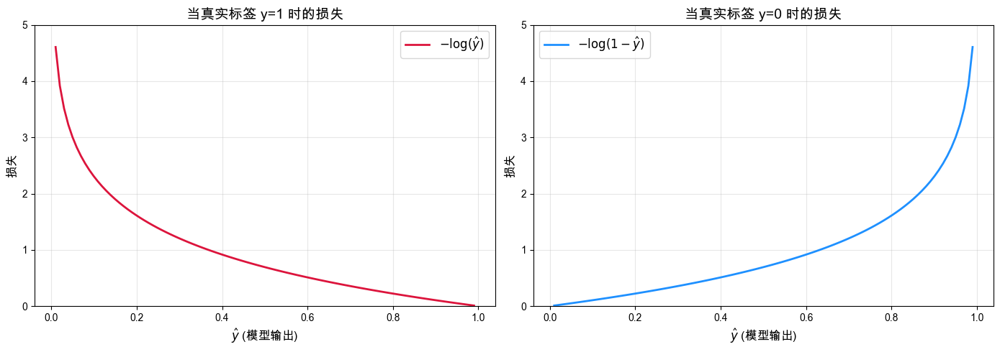

In [159]:
def binary_cross_entropy(y_true, y_pred):
    """
    计算二元交叉熵损失
    
    注意：为了数值稳定性，需要对 y_pred 进行 clip
    """
    eps = 1e-7  # 防止 log(0)
    y_pred = np.clip(y_pred, eps, 1 - eps)
    return -np.mean(y_true * np.log(y_pred) + (1 - y_true) * np.log(1 - y_pred))

# 可视化：当 y=1 时，损失随 y_pred 的变化
y_pred_plot = np.linspace(0.01, 0.99, 100)
loss_when_y1 = -np.log(y_pred_plot)       # y=1: loss = -log(y_pred)
loss_when_y0 = -np.log(1 - y_pred_plot)   # y=0: loss = -log(1-y_pred)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(y_pred_plot, loss_when_y1, 'crimson', linewidth=2, label=r'$-\log(\hat{y})$')
axes[0].set_xlabel('$\hat{y}$ (模型输出)', fontsize=12)
axes[0].set_ylabel('损失', fontsize=12)
axes[0].set_title('当真实标签 y=1 时的损失', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0, 5])

axes[1].plot(y_pred_plot, loss_when_y0, 'dodgerblue', linewidth=2, label=r'$-\log(1-\hat{y})$')
axes[1].set_xlabel('$\hat{y}$ (模型输出)', fontsize=12)
axes[1].set_ylabel('损失', fontsize=12)
axes[1].set_title('当真实标签 y=0 时的损失', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 5])

plt.tight_layout()
plt.show()

---
## 5. 反向传播：梯度推导（金公式！）

### 核心发现：梯度极其简洁

当我们把 Sigmoid 和 BCE 组合在一起时，梯度会变得**惊人地简洁**：

$$\frac{\partial L}{\partial z} = \hat{y} - y$$

是的，就这么简单！误差 = 预测值 - 真实值。

然后通过链式法则：

$$\frac{\partial L}{\partial w} = \frac{1}{N} X^\top (\hat{y} - y)$$

$$\frac{\partial L}{\partial b} = \frac{1}{N} \sum (\hat{y} - y)$$

### 与线性回归的对比

| | 线性回归 | 逻辑回归 |
|---|---------|----------|
| 输出 | $\hat{y} = wx + b$ | $\hat{y} = \sigma(wx + b)$ |
| 损失函数 | MSE | BCE |
| 梯度形式 | $\frac{\partial L}{\partial w} \propto (\hat{y} - y) \cdot x$ | $\frac{\partial L}{\partial w} \propto (\hat{y} - y) \cdot x$ |
| 更新规则 | $w \leftarrow w - \eta \cdot \nabla w$ | $w \leftarrow w - \eta \cdot \nabla w$ |

> **顺桥梁**：虽然任务从回归变成分类，但训练的核心形式保持一致！

---
## 6. 代码实现：完整的训练流程

下面我们实现完整的逻辑回归训练过程。

In [160]:
# 超参数
learning_rate = 0.0005
num_epochs = 500

# 初始化参数（小随机值）
w = np.random.randn(2) * 0.01  # 权重向量 (2,)
b = 0.0                         # 偏置标量

# 记录训练历史
history = {'loss': [], 'accuracy': [], 'w1': [], 'w2': [], 'b': []}

print(f"初始参数: w = [{w[0]:.4f}, {w[1]:.4f}], b = {b:.4f}")
print("-" * 60)

初始参数: w = [-0.0060, -0.0112], b = 0.0000
------------------------------------------------------------


In [161]:
for epoch in range(num_epochs):
    # ========== 前向传播 ==========
    # 1. 计算 logit: z = X @ w + b
    z = X @ w + b  # shape: (N,)
    
    # 2. Sigmoid 得到概率: y_pred = sigmoid(z)
    y_pred = sigmoid(z)  # shape: (N,)
    
    # 3. 计算 BCE 损失
    loss = binary_cross_entropy(y, y_pred)
    
    # 4. 计算准确率
    predictions = (y_pred > 0.5).astype(float)
    accuracy = np.mean(predictions == y)
    
    # ========== 反向传播 ==========
    # 误差 = 预测 - 真实
    error = y_pred - y  # shape: (N,)
    
    # 计算梯度
    dw = (1 / N) * (X.T @ error)  # shape: (2,)
    db = (1 / N) * np.sum(error)  # 标量
    
    # ========== 梯度下降更新 ==========
    w = w - learning_rate * dw
    b = b - learning_rate * db
    
    # 记录历史
    history['loss'].append(loss)
    history['accuracy'].append(accuracy)
    history['w1'].append(w[0])
    history['w2'].append(w[1])
    history['b'].append(b)
    
    # 打印进度
    if epoch % 10 == 0 or epoch == num_epochs - 1:
        print(f"Epoch {epoch:4d} | Loss: {loss:.4f} | Accuracy: {accuracy*100:.1f}% | w=[{w[0]:.3f}, {w[1]:.3f}], b={b:.3f}")

Epoch    0 | Loss: 0.7023 | Accuracy: 0.5% | w=[-0.006, -0.011], b=-0.000
Epoch   10 | Loss: 0.6995 | Accuracy: 1.0% | w=[-0.003, -0.008], b=-0.000
Epoch   20 | Loss: 0.6966 | Accuracy: 1.5% | w=[-0.000, -0.005], b=-0.000
Epoch   30 | Loss: 0.6938 | Accuracy: 24.5% | w=[0.002, -0.003], b=-0.000
Epoch   40 | Loss: 0.6910 | Accuracy: 95.5% | w=[0.005, -0.000], b=0.000
Epoch   50 | Loss: 0.6882 | Accuracy: 99.0% | w=[0.007, 0.003], b=0.000
Epoch   60 | Loss: 0.6854 | Accuracy: 100.0% | w=[0.010, 0.005], b=0.000
Epoch   70 | Loss: 0.6827 | Accuracy: 100.0% | w=[0.012, 0.008], b=0.000
Epoch   80 | Loss: 0.6800 | Accuracy: 100.0% | w=[0.015, 0.011], b=0.000
Epoch   90 | Loss: 0.6772 | Accuracy: 100.0% | w=[0.018, 0.013], b=0.000
Epoch  100 | Loss: 0.6746 | Accuracy: 100.0% | w=[0.020, 0.016], b=0.000
Epoch  110 | Loss: 0.6719 | Accuracy: 100.0% | w=[0.023, 0.019], b=0.000
Epoch  120 | Loss: 0.6692 | Accuracy: 100.0% | w=[0.025, 0.021], b=0.000
Epoch  130 | Loss: 0.6666 | Accuracy: 100.0% | w

In [162]:
print("-" * 60)
print(f"最终参数: w = [{w[0]:.4f}, {w[1]:.4f}], b = {b:.4f}")
print(f"最终损失: {history['loss'][-1]:.4f}")
print(f"最终准确率: {history['accuracy'][-1]*100:.1f}%")

------------------------------------------------------------
最终参数: w = [0.1156, 0.1146], b = 0.0001
最终损失: 0.5799
最终准确率: 100.0%


---
## 7. 训练过程可视化

### 7.1 Loss 和 Accuracy 曲线

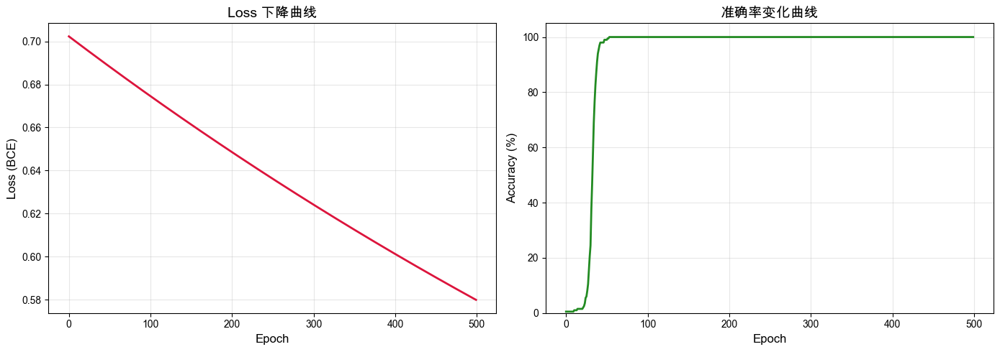

In [163]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss 曲线
axes[0].plot(history['loss'], color='crimson', linewidth=2)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss (BCE)', fontsize=12)
axes[0].set_title('Loss 下降曲线', fontsize=14)
axes[0].grid(True, alpha=0.3)

# Accuracy 曲线
axes[1].plot(np.array(history['accuracy']) * 100, color='forestgreen', linewidth=2)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('准确率变化曲线', fontsize=14)
axes[1].set_ylim([0, 105])
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 7.2 决策边界可视化（重点！）

决策边界是满足 $z = 0$ 的点的集合，即：

$$w_1 x_1 + w_2 x_2 + b = 0$$

这是一条**直线**。我们可以把它画出来，看看模型是如何分割两类数据的。

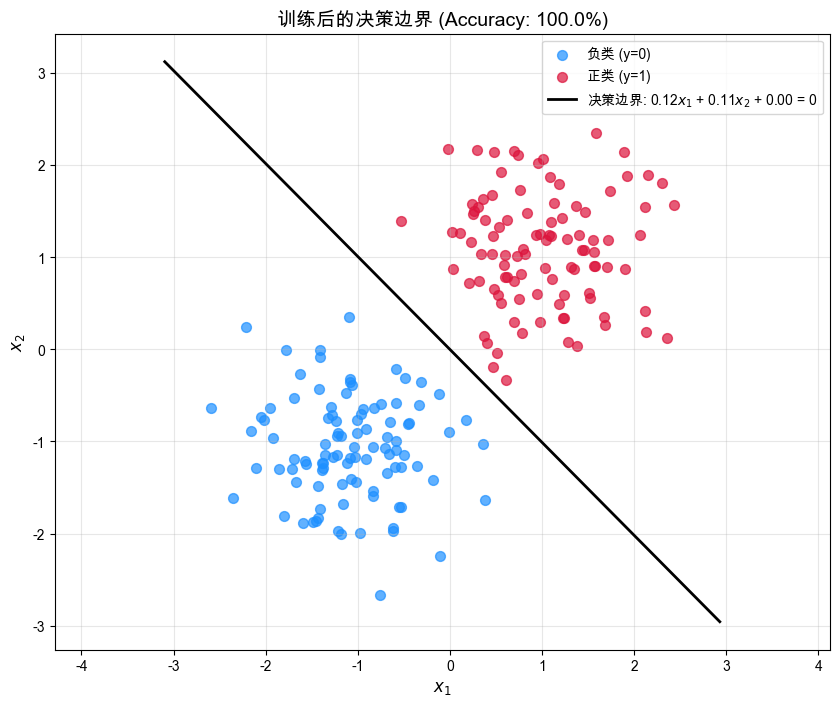

In [164]:
def plot_decision_boundary(X, y, w, b, title="决策边界"):
    """
    绘制数据点和决策边界
    """
    plt.figure(figsize=(10, 8))
    
    # 绘制数据点
    plt.scatter(X[y == 0, 0], X[y == 0, 1], c='dodgerblue', label='负类 (y=0)', alpha=0.7, s=50)
    plt.scatter(X[y == 1, 0], X[y == 1, 1], c='crimson', label='正类 (y=1)', alpha=0.7, s=50)
    
    # 绘制决策边界：w1*x1 + w2*x2 + b = 0 => x2 = -(w1*x1 + b) / w2
    x1_line = np.linspace(X[:, 0].min() - 0.5, X[:, 0].max() + 0.5, 100)
    if abs(w[1]) > 1e-6:  # 防止除以0
        x2_line = -(w[0] * x1_line + b) / w[1]
        plt.plot(x1_line, x2_line, 'k-', linewidth=2, label=f'决策边界: {w[0]:.2f}$x_1$ + {w[1]:.2f}$x_2$ + {b:.2f} = 0')
    
    plt.xlabel('$x_1$', fontsize=12)
    plt.ylabel('$x_2$', fontsize=12)
    plt.title(title, fontsize=14)
    plt.legend(loc='best')
    plt.axis('equal')
    plt.grid(True, alpha=0.3)
    plt.show()

plot_decision_boundary(X, y, w, b, title=f"训练后的决策边界 (Accuracy: {history['accuracy'][-1]*100:.1f}%)")

### 7.3 概率热力图

下图展示了模型在整个平面上输出的概率分布。红色区域表示模型认为是正类的概率高，蓝色区域表示负类概率高。

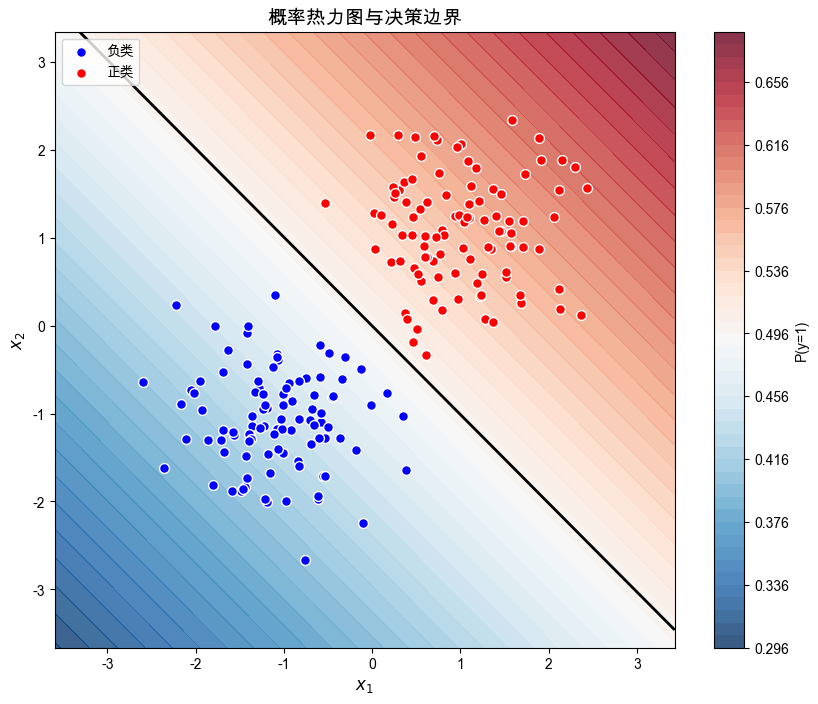

In [165]:
# 创建网格
xx, yy = np.meshgrid(
    np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 200),
    np.linspace(X[:, 1].min() - 1, X[:, 1].max() + 1, 200)
)
grid = np.c_[xx.ravel(), yy.ravel()]

# 计算每个网格点的预测概率
z_grid = grid @ w + b
prob_grid = sigmoid(z_grid).reshape(xx.shape)

# 绘图
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, prob_grid, levels=50, cmap='RdBu_r', alpha=0.8)
plt.colorbar(contour, label='P(y=1)')

# 画 0.5 等值线（决策边界）
plt.contour(xx, yy, prob_grid, levels=[0.5], colors='black', linewidths=2)

# 数据点
plt.scatter(X[y == 0, 0], X[y == 0, 1], c='blue', edgecolors='white', s=50, label='负类')
plt.scatter(X[y == 1, 0], X[y == 1, 1], c='red', edgecolors='white', s=50, label='正类')

plt.xlabel('$x_1$', fontsize=12)
plt.ylabel('$x_2$', fontsize=12)
plt.title('概率热力图与决策边界', fontsize=14)
plt.legend(loc='upper left')
plt.axis('equal')
plt.show()

---
## 8. 实验：动手探索

### 实验 1：调整 sigma（类间重叠程度）

当 `sigma` 增大时，两类数据会更加重叠，分类任务变得更难。

**预期结果**：
- 准确率上限会下降（因为数据本身有重叠，不可能 100% 分开）
- 决策边界位置可能略有变化

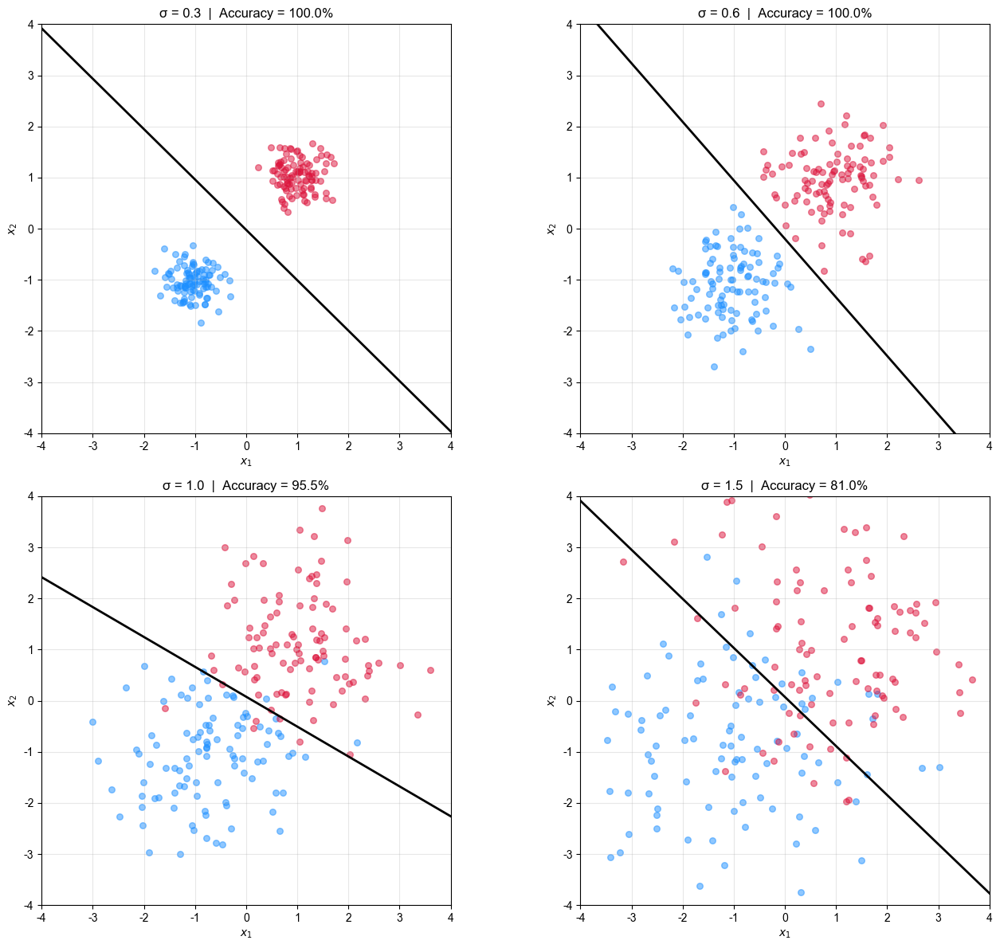

In [166]:
def train_logistic_regression(X, y, lr=0.1, epochs=2000):
    """训练逻辑回归模型"""
    N = len(y)
    w = np.random.randn(2) * 0.01
    b = 0.0
    
    for _ in range(epochs):
        z = X @ w + b
        y_pred = sigmoid(z)
        error = y_pred - y
        w = w - lr * (1/N) * (X.T @ error)
        b = b - lr * (1/N) * np.sum(error)
    
    # 最终准确率
    predictions = (sigmoid(X @ w + b) > 0.5).astype(float)
    accuracy = np.mean(predictions == y)
    return w, b, accuracy

# 测试不同的 sigma
sigmas = [0.3, 0.6, 1.0, 1.5]
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

np.random.seed(0)
for idx, sigma_test in enumerate(sigmas):
    # 生成新数据
    X_pos_test = np.random.randn(N // 2, 2) * sigma_test + np.array([1, 1])
    X_neg_test = np.random.randn(N // 2, 2) * sigma_test + np.array([-1, -1])
    X_test = np.vstack([X_pos_test, X_neg_test])
    y_test = np.hstack([np.ones(N // 2), np.zeros(N // 2)])
    
    # 训练
    w_test, b_test, acc_test = train_logistic_regression(X_test, y_test)
    
    # 绘图
    ax = axes[idx]
    ax.scatter(X_test[y_test == 0, 0], X_test[y_test == 0, 1], c='dodgerblue', alpha=0.5, s=30)
    ax.scatter(X_test[y_test == 1, 0], X_test[y_test == 1, 1], c='crimson', alpha=0.5, s=30)
    
    # 决策边界
    x1_line = np.linspace(-4, 4, 100)
    if abs(w_test[1]) > 1e-6:
        x2_line = -(w_test[0] * x1_line + b_test) / w_test[1]
        ax.plot(x1_line, x2_line, 'k-', linewidth=2)
    
    ax.set_xlim([-4, 4])
    ax.set_ylim([-4, 4])
    ax.set_title(f'σ = {sigma_test}  |  Accuracy = {acc_test*100:.1f}%', fontsize=12)
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal')

plt.tight_layout()
plt.show()

**观察结果**：

- $\sigma = 0.3$：两类几乎完全分开，准确率接近 100%
- $\sigma = 0.6$：有少量重叠，准确率略有下降
- $\sigma = 0.4$：明显重叠，准确率开始下降
- $\sigma = 1.5$：大量重叠，准确率有明显上限

> **核心洞察**：当数据本身不可完全分开时，模型的准确率会有天花板——这就是**不可约误差 (Irreducible Error)**。

---
## 9. 课堂检查点：6 个必答问题

学完这一课，请确保你能回答以下问题：

### 问题 1：为什么输出要用 Sigmoid？

> **答案**：因为分类问题需要输出概率。Sigmoid 把任意实数 $z \in (-\infty, +\infty)$ 压缩到 $(0, 1)$，正好可以解释为"属于正类的概率"。

### 问题 2：为什么损失函数用 BCE 而不是 MSE？

> **答案**：
> - MSE + Sigmoid 组合会导致饱和区域梯度消失，学习很慢
> - BCE 与 Bernoulli 分布的似然匹配，是统计意义上"正确"的选择
> - BCE 梯度简洁：$\nabla_z L = \hat{y} - y$

### 问题 3：为什么梯度里会出现 $\hat{y} - y$？

> **答案**：这是 BCE + Sigmoid 组合的数学结果。通过链式法则展开后，复杂的表达式恰好化简为预测值减去真实值。这个简洁的形式让逻辑回归的训练非常高效。

### 问题 4：为什么决策边界一定是直线？

> **答案**：因为模型是 $z = w_1 x_1 + w_2 x_2 + b$，这是关于 $(x_1, x_2)$ 的**线性函数**。决策边界 $z = 0$ 的解集就是一条直线 $w_1 x_1 + w_2 x_2 + b = 0$。如果想要曲线边界，需要用非线性模型（如神经网络）。

### 问题 5：sigma 增大（类重叠）时，accuracy 上限为什么下降？

> **答案**：当两类数据重叠时，同一个位置可能同时包含正类和负类的样本。无论决策边界怎么画，都无法把它们完全分开。这就是**不可约误差**——由数据本身的噪声和重叠造成，模型无法消除。

### 问题 6：如果把特征整体乘 100，会发生什么？

> **答案**：
> - 梯度会变大约 100 倍（因为 $\nabla_w L \propto X^T$）
> - 如果学习率不变，参数更新步长会太大，可能导致震荡或发散
> - 解决方案：减小学习率，或者对数据进行标准化

---
## 10. 总结与下一步

### 核心要点回顾

| 概念 | 要点 |
|-----|------|
| 任务类型 | 二分类（不是回归！） |
| 模型结构 | 线性分数 → Sigmoid → 概率 |
| 损失函数 | Binary Cross Entropy (BCE) |
| 梯度公式 | $\nabla_z L = \hat{y} - y$（极简！） |
| 决策边界 | 直线 $w^\top x + b = 0$ |
| 训练方式 | 仍是梯度下降 |

### 逻辑回归的局限性

逻辑回归的决策边界是**直线**（或高维中的超平面）。这意味着：
- 它只能处理**线性可分**的数据
- 对于复杂的非线性模式（如圆形边界、XOR 问题），它无能为力

### 下一课预告：多层感知机 (MLP)

为了突破线性的限制，我们需要：
1. **多层结构**：堆叠多个线性变换
2. **非线性激活函数**：在层之间加入 ReLU 等函数

这就是**多层感知机 (Multi-Layer Perceptron, MLP)**——神经网络的基础形式！

```
输入 → [线性变换 + 激活] → [线性变换 + 激活] → ... → 输出
```

下一课，我们将用一个经典的 **XOR 问题** 来展示为什么需要 MLP，以及如何实现它。

---
## 附录：动画演示训练过程

In [168]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

# 重新训练，保存中间状态
np.random.seed(0)
w_anim = np.random.randn(2) * 0.01
b_anim = 0.0
lr_anim = 0.1

frames_w = [w_anim.copy()]
frames_b = [b_anim]
frames_loss = []
frames_acc = []

for epoch in range(100):
    z = X @ w_anim + b_anim
    y_pred = sigmoid(z)
    loss = binary_cross_entropy(y, y_pred)
    acc = np.mean((y_pred > 0.5).astype(float) == y)
    
    frames_loss.append(loss)
    frames_acc.append(acc)
    
    error = y_pred - y
    w_anim = w_anim - lr_anim * (1/N) * (X.T @ error)
    b_anim = b_anim - lr_anim * (1/N) * np.sum(error)
    
    frames_w.append(w_anim.copy())
    frames_b.append(b_anim)

# 创建动画
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# 左图：数据和决策边界
ax1.scatter(X[y == 0, 0], X[y == 0, 1], c='dodgerblue', alpha=0.5, s=30)
ax1.scatter(X[y == 1, 0], X[y == 1, 1], c='crimson', alpha=0.5, s=30)
decision_line, = ax1.plot([], [], 'k-', linewidth=2)
ax1.set_xlim([X[:, 0].min() - 0.5, X[:, 0].max() + 0.5])
ax1.set_ylim([X[:, 1].min() - 0.5, X[:, 1].max() + 0.5])
ax1.set_xlabel('$x_1$')
ax1.set_ylabel('$x_2$')
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')
title1 = ax1.set_title('')

# 右图：Loss 和 Accuracy
loss_line, = ax2.plot([], [], 'crimson', linewidth=2, label='Loss')
ax2.set_xlim([0, 100])
ax2.set_ylim([0, max(frames_loss) * 1.1])
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')
ax2.grid(True, alpha=0.3)

ax2_twin = ax2.twinx()
acc_line, = ax2_twin.plot([], [], 'forestgreen', linewidth=2, label='Accuracy')
ax2_twin.set_ylabel('Accuracy', color='forestgreen')
ax2_twin.set_ylim([0, 1.1])
ax2_twin.tick_params(axis='y', labelcolor='forestgreen')

def animate(i):
    # 更新决策边界
    w_curr = frames_w[i]
    b_curr = frames_b[i]
    x1_range = np.linspace(X[:, 0].min() - 0.5, X[:, 0].max() + 0.5, 100)
    if abs(w_curr[1]) > 1e-6:
        x2_range = -(w_curr[0] * x1_range + b_curr) / w_curr[1]
        decision_line.set_data(x1_range, x2_range)
    
    title1.set_text(f'Epoch {i} | w=[{w_curr[0]:.3f}, {w_curr[1]:.3f}], b={b_curr:.3f}')
    
    # 更新曲线
    if i > 0:
        loss_line.set_data(range(i), frames_loss[:i])
        acc_line.set_data(range(i), frames_acc[:i])
    
    return decision_line, title1, loss_line, acc_line

anim = FuncAnimation(fig, animate, frames=len(frames_w), interval=100, blit=False)
plt.close()
HTML(anim.to_jshtml())